# Guide on how to use the backtester

In [41]:
# Ensure the project root is in PATH.
import sys
sys.path.append("../")
# All imports of our code are relative to the project root.

from backtester.backtester import Backtester
from backtester.datamodel import TradingState, OrderDepth, Order, Listing

import numpy as np
import pandas as pd
import sys
import os

This is the implementation of our trader

In [42]:
def size_function(z, edge_0, edge_max, max_position = 50):
    z = np.array(z)
    direction = np.where(z > 0, -1, 1)
    abs_z = np.abs(z)
    size = np.where(
        abs_z <= edge_0,
        0,
        np.where(
            abs_z >= edge_max,
            max_position,
            max_position * ((abs_z - edge_0) / (edge_max - edge_0)) ** 2
        )
    )
    return direction * size

def exit_size_function(z, edge_0, edge_max, max_position = 50):
    # Positive quadratic function with points (0, 0) and (-2, 50)
    if z <= 0:
        if z >= -edge_0:
            return 0
        elif z <= -edge_max:
            return max_position
            
        a = -max_position/(edge_max - edge_0)**2
        return a * (z + edge_max)**2 + max_position
    else:
        if z <= edge_0:
            return 0
        elif z >= edge_max:
            return -max_position
        a = max_position/(edge_max - edge_0)**2
        return a * (z-edge_max)**2 - max_position


In [90]:
class Trader:

    kelp_df = pd.DataFrame(columns=[
        "timestamp", "product",
        "bid_price_1", "bid_volume_1", "bid_price_2", "bid_volume_2", "bid_price_3", "bid_volume_3",
        "ask_price_1", "ask_volume_1", "ask_price_2", "ask_volume_2", "ask_price_3", "ask_volume_3",
        "mid_price", "profit_and_loss"
    ])

    resin_df = pd.DataFrame(columns=[
        "timestamp", "product",
        "bid_price_1", "bid_volume_1", "bid_price_2", "bid_volume_2", "bid_price_3", "bid_volume_3",
        "ask_price_1", "ask_volume_1", "ask_price_2", "ask_volume_2", "ask_price_3", "ask_volume_3",
        "mid_price", "profit_and_loss"
    ])

    squink_df = pd.DataFrame(columns=[
        "timestamp", "product",
        "bid_price_1", "bid_volume_1", "bid_price_2", "bid_volume_2", "bid_price_3", "bid_volume_3",
        "ask_price_1", "ask_volume_1", "ask_price_2", "ask_volume_2", "ask_price_3", "ask_volume_3",
        "mid_price", "profit_and_loss"
    ])
    # “If none of the bots trade on an outstanding player quote, the quote is automatically cancelled at the end of the iteration.”

    # I think this might make knowing which curve to move on easier, but what if the spread jumps from -50 to +50? 
    # We will def want to close out. I guess it depends on current position then
    z_ask = ""
    z_bid = ""
    
    def update_df(df, product, state, orders, order_depth):
        buy_orders = sorted(order_depth.buy_orders.items(), key=lambda x: -x[0])
        sell_orders = sorted(order_depth.sell_orders.items(), key=lambda x: x[0])

        bid_levels = buy_orders[:3] + [(None, None)] * (3 - len(buy_orders))
        ask_levels = sell_orders[:3] + [(None, None)] * (3 - len(sell_orders))

        if bid_levels[0][0] is not None and ask_levels[0][0] is not None:
            mid_price = (bid_levels[0][0] + ask_levels[0][0]) / 2
        else:
            mid_price = None

        row = {
            "timestamp": state.timestamp,
            "product": product,
            "bid_price_1": bid_levels[0][0], "bid_volume_1": bid_levels[0][1],
            "bid_price_2": bid_levels[1][0], "bid_volume_2": bid_levels[1][1],
            "bid_price_3": bid_levels[2][0], "bid_volume_3": bid_levels[2][1],
            "ask_price_1": ask_levels[0][0], "ask_volume_1": ask_levels[0][1],
            "ask_price_2": ask_levels[1][0], "ask_volume_2": ask_levels[1][1],
            "ask_price_3": ask_levels[2][0], "ask_volume_3": ask_levels[2][1],
            "mid_price": mid_price,
        }

        df.loc[len(df)] = row



    def run(self, state: TradingState):
        # Only method required. It takes all buy and sell orders for all symbols as an input, and outputs a list of orders to be sent

        result = {}
        synthetic_bid = 0    # What I can sell at
        synthetic_offer = 0    # What I can buy at
        best_ask = 0
        best_bid = 0
        best_ask_jam = 0
        best_bid_jam = 0
        best_bid_croissant = 0
        best_ask_croissant = 0
        best_bid_djembes = 0
        best_ask_djembes = 0

        available_sell = 0
        available_buy = 0
        print(state.position)
        
        for product in state.order_depths:
            order_depth: OrderDepth = state.order_depths[product]
            orders: List[Order] = []
            # Basket 2 is 4 croissants, 2 jams
            if product == "CROISSANTS":
                if len(order_depth.sell_orders) != 0 and len(order_depth.buy_orders) != 0:
                    best_ask_croissant, best_ask_amount_croissant = list(order_depth.sell_orders.items())[0]
                    best_bid_croissant, best_bid_amount_croissant = list(order_depth.buy_orders.items())[0]
                    synthetic_bid += best_bid_croissant * 6
                    synthetic_offer += best_ask_croissant * 6

            if product == "JAMS":
                if len(order_depth.sell_orders) != 0 and len(order_depth.buy_orders) != 0:
                    best_ask_jam, best_ask_amount_jam = list(order_depth.sell_orders.items())[0]
                    best_bid_jam, best_bid_amount_jam = list(order_depth.buy_orders.items())[0]
                    synthetic_bid += best_bid_jam * 3
                    synthetic_offer += best_ask_jam * 3
                    
            if product == "DJEMBES":
                if len(order_depth.sell_orders) != 0 and len(order_depth.buy_orders) != 0:
                    best_ask_djembes, best_ask_amount_djembes = list(order_depth.sell_orders.items())[0]
                    best_bid_djembes, best_bid_amount_djembes = list(order_depth.buy_orders.items())[0]
                    synthetic_bid += best_bid_djembes * 1
                    synthetic_offer += best_ask_djembes * 1

            if product == 'PICNIC_BASKET1':
                if len(order_depth.sell_orders) != 0 and len(order_depth.buy_orders) != 0:
                    best_ask, best_ask_amount = list(order_depth.sell_orders.items())[0]
                    best_bid, best_bid_amount = list(order_depth.buy_orders.items())[0]

        available_sell = min(int(best_bid_amount_croissant / 6), int(best_bid_amount_jam / 3), int(best_bid_amount_djembes))   # How many we can sell synthetica lly
        available_buy = min(int(abs(best_ask_amount_croissant) / 6), int(abs(best_ask_amount_jam) / 3), int(abs(best_ask_amount_djembes)))    # How many we can buy synthetically

        edge_0 = 60
        edge_max = 170

        edge_max_retreet = 140    #T HIS is higher than edge_0
        edge_0_retreet = 20

        position_max = int(250/6)

        basket_2_position = state.position.get("PICNIC_BASKET1", 0)
        sell = False
        buy = False
        print(f"BEST ASK: {best_ask}, BEST BID: {best_bid}, Synthetic Bid: {synthetic_bid}, Synthetic Offer: {synthetic_offer}")

        # Redoing entry and exit scheme:
        z_mid = (best_bid + best_ask)/2 - (synthetic_bid + synthetic_offer)/2
        pos_buy = size_function(z_mid, edge_0, edge_max, position_max)
        pos_sell = exit_size_function(z_mid, edge_0_retreet, edge_max_retreet, position_max)
        print(z_mid)
        if z_mid > 0:
            # We only move on the entry curve. Enter more or hold.
           
            if pos_buy <= basket_2_position:
                print("On the entry curve")
                target_position = pos_buy
                trade_needed = int(target_position - basket_2_position)
                trade_multiplier = min(abs(trade_needed), available_buy, abs(best_bid_amount))
                #print(available_buy, abs(trade_needed))
                #print(trade_multiplier)
                
                result['PICNIC_BASKET1'] = [Order('PICNIC_BASKET1', best_bid, -trade_multiplier)]
                result['JAMS'] = [Order('JAMS', best_ask_jam, 3 * trade_multiplier)]
                result['CROISSANTS'] = [Order('CROISSANTS', best_ask_croissant, 6 * trade_multiplier)]
                result['DJEMBES'] = [Order('DJEMBES', best_ask_djembes, 1 * trade_multiplier)]

                print(f"In z_mid > 0, and entering. position: {basket_2_position}, target_position: {target_position}, trade_needed: {trade_needed}")

            else:
                print("Not on entry curve")
                target_position = max(pos_sell, min(basket_2_position, 0))
                
                trade_needed = int(target_position - basket_2_position)
                trade_multiplier = min(abs(trade_needed), available_sell, abs(best_ask_amount))
                
                result['PICNIC_BASKET1'] = [Order('PICNIC_BASKET1', best_ask, trade_multiplier)]
                result['JAMS'] = [Order('JAMS', best_bid_jam, -3 * trade_multiplier)]
                result['CROISSANTS'] = [Order('CROISSANTS', best_bid_croissant, -6 * trade_multiplier)]
                result['DJEMBES'] = [Order('DJEMBES', best_bid_djembes, -1 * trade_multiplier)]

                print(f"In z_mid > 0, and exiting. position: {basket_2_position}, target_position: {target_position}, trade_needed: {trade_needed}")

            #print(f"z_mid: {z_mid}, target_position: {target_position}, self_position: {basket_2_position}, trade_needed: {trade_needed}, order: {result}")

        
        elif z_mid < 0:
            if pos_buy >= basket_2_position:
                print("On the entry curve")
                target_position = pos_buy
                trade_needed = int(target_position - basket_2_position)
                trade_multiplier = min(abs(trade_needed), available_sell,abs(best_ask_amount))
                
                result['PICNIC_BASKET1'] = [Order('PICNIC_BASKET1', best_ask, trade_multiplier)]
                result['JAMS'] = [Order('JAMS', best_bid_jam, -3 * trade_multiplier)]
                result['CROISSANTS'] = [Order('CROISSANTS', best_bid_croissant, -6 * trade_multiplier)]
                result['DJEMBES'] = [Order('DJEMBES', best_bid_djembes, -1 * trade_multiplier)]

                print(f"In z_mid < 0, and entering. position: {basket_2_position}, target_position: {target_position}, trade_needed: {trade_needed}")

            else:
                print("Not on entry curve")
                target_position = min(pos_sell, max(basket_2_position, 0))
                
                trade_needed = int(target_position - basket_2_position)
                trade_multiplier = min(abs(trade_needed), available_buy,abs(best_bid_amount))
                
                result['PICNIC_BASKET1'] = [Order('PICNIC_BASKET1', best_bid, -trade_multiplier)]
                result['JAMS'] = [Order('JAMS', best_ask_jam, 3 * trade_multiplier)]
                result['CROISSANTS'] = [Order('CROISSANTS', best_ask_croissant, 6 * trade_multiplier)]
                result['DJEMBES'] = [Order('DJEMBES', best_ask_djembes, 1 * trade_multiplier)]
                print(f"In z_mid < 0, and exiting. position: {basket_2_position}, target_position: {target_position}, trade_needed: {trade_needed}")

            #print(f"z_mid: {z_mid}, target_position: {target_position}, self_position: {basket_2_position}, trade_needed: {trade_needed}, order: {result}")

 
        print(result)

        traderData = "SAMPLE"  # String value holding Trader state data required. It will be delivered as TradingState.traderData on next execution.

        conversions = 1
        return result, conversions, traderData





Copy paste these below lines whenever you want to access the historical data. These have datatype `pd.Dataframe`.  

If you want all 3 days combined into 1, then copy the code for `market_data_all3days` and `trades_all3days`. You can't just `pd.concat()` them all because the backtester doesn't consider day.

In [91]:
market_data_day_0 = pd.read_csv(os.path.join("..", "data", "round2", "prices_round_2_day_-1.csv"), sep=";")
market_data_day_neg1 = pd.read_csv(os.path.join("..", "data", "round2", "prices_round_2_day_0.csv"), sep=";")
market_data_day_neg2 = pd.read_csv(os.path.join("..", "data", "round2", "prices_round_2_day_1.csv"), sep=";")

trades_day_0 = pd.read_csv(os.path.join("..", "data", "round2", "trades_round_2_day_-1.csv"), sep=";")
trades_day_neg1 = pd.read_csv(os.path.join("..", "data", "round2", "trades_round_2_day_0.csv"), sep=";")
trades_day_neg2 = pd.read_csv(os.path.join("..", "data", "round2", "trades_round_2_day_1.csv"), sep=";")


# concatenates multiple days of historical data into 1.
# drops day column and replaces it with continuous timestamps.
# i.e. day -1 timestamp 0 becomes just timestamp 1,000,000
def concatenate_historical_data(data: list[pd.DataFrame]) -> pd.DataFrame:
    output = data[0]

    for i in range(1, len(data), 1):
        timeshift = output.iloc[-1]["timestamp"] + 100  # 100 for next day
        next_day_copy = data[i].copy()
        next_day_copy["timestamp"] += timeshift

        output = pd.concat([output, next_day_copy])

    return output

market_data_all3days = concatenate_historical_data([market_data_day_neg2, market_data_day_neg1, market_data_day_0])
trades_all3days = concatenate_historical_data([trades_day_neg2, trades_day_neg1, trades_day_0])

In [92]:
market_data_round_2_day_neg1 = pd.read_csv(os.path.join("..", "data", "round2", "prices_round_2_day_-1.csv"), sep=";")
market_data_round_2_day_0 = pd.read_csv(os.path.join("..", "data", "round2", "prices_round_2_day_0.csv"), sep=";")
market_data_round_2_day_1 = pd.read_csv(os.path.join("..", "data", "round2", "prices_round_2_day_1.csv"), sep=";")

trades_round_2_day_neg1 = pd.read_csv(os.path.join("..", "data", "round2", "trades_round_2_day_-1.csv"), sep=";")
trades_round_2_day_0 = pd.read_csv(os.path.join("..", "data", "round2", "trades_round_2_day_0.csv"), sep=";")
trades_round_2_day_1 = pd.read_csv(os.path.join("..", "data", "round2", "trades_round_2_day_1.csv"), sep=";")


market_data_round_2_all3days = concatenate_historical_data([market_data_round_2_day_neg1, market_data_round_2_day_0, market_data_round_2_day_1])
trades_round_2_all3days = concatenate_historical_data([trades_round_2_day_neg1, trades_round_2_day_0, trades_round_2_day_1])

Lets run the backtester

In [93]:
# 1. Define the listings.
listings = {
    "KELP": Listing(symbol="KELP", product="KELP", denomination="SEASHELLS"),
    "RAINFOREST_RESIN": Listing(symbol="RAINFOREST_RESIN", product="RAINFOREST_RESIN", denomination="SEASHELLS"),
    "SQUID_INK": Listing(symbol="SQUID_INK", product="SQUID_INK", denomination="SEASHELLS"),
    "CROISSANTS": Listing(symbol="CROISSANTS", product="CROISSANTS", denomination="SEASHELLS"),
    "DJEMBES": Listing(symbol="DJEMBES", product="DJEMBES", denomination="SEASHELLS"),
    "JAMS": Listing(symbol="JAMS", product="JAMS", denomination="SEASHELLS"),
    "PICNIC_BASKET1": Listing(symbol="PICNIC_BASKET1", product="PICNIC_BASKET1", denomination="SEASHELLS"),
    "PICNIC_BASKET2": Listing(symbol="PICNIC_BASKET2", product="PICNIC_BASKET2", denomination="SEASHELLS")
}

# 2. Define the position limits.
position_limit = {
    "KELP": 50,
    "RAINFOREST_RESIN": 50,
    "SQUID_INK": 50,
    "CROISSANTS": 250,
    "JAMS": 350,
    "DJEMBES": 60,
    "PICNIC_BASKET1": 60,
    "PICNIC_BASKET2": 100
    
}


# 3. Define fair value evaluation functions. This is used to determine what our PNL is at times throughout execution when our net position is not 0.
def calc_rainforest_resin_fair(order_depth: OrderDepth) -> float:
    return 10000


fair_value_evaluator = {
    # omitting dictionary entries for KELP, SQUID_INK, so that they use default behaviour: fair_price = (best_bid+best_ask)/2
    "RAINFOREST_RESIN": calc_rainforest_resin_fair,
}


# 4. Market data and trade history files.
# These already exist, look at the previous jupyter cell.

# 5. Instantiate trader object
trader = Trader()
bt = Backtester(trader, listings, position_limit, fair_value_evaluator, market_data_round_2_all3days, trades_round_2_all3days, output_log_filename="steven_basket1.log")


bt.run()

print(bt.pnl)

{'KELP': 0, 'RAINFOREST_RESIN': 0, 'SQUID_INK': 0, 'CROISSANTS': 0, 'DJEMBES': 0, 'JAMS': 0, 'PICNIC_BASKET1': 0, 'PICNIC_BASKET2': 0}
BEST ASK: 59294, BEST BID: 59284, Synthetic Bid: 59284, Synthetic Offer: 59294
0.0
{}
{'KELP': 0, 'RAINFOREST_RESIN': 0, 'SQUID_INK': 0, 'CROISSANTS': 0, 'DJEMBES': 0, 'JAMS': 0, 'PICNIC_BASKET1': 0, 'PICNIC_BASKET2': 0}
BEST ASK: 59292, BEST BID: 59282, Synthetic Bid: 59283, Synthetic Offer: 59294
-1.5
On the entry curve
In z_mid < 0, and entering. position: 0, target_position: 0.0, trade_needed: 0
{'PICNIC_BASKET1': [(PICNIC_BASKET1, 59292, 0)], 'JAMS': [(JAMS, 6670, 0)], 'CROISSANTS': [(CROISSANTS, 4304, 0)], 'DJEMBES': [(DJEMBES, 13449, 0)]}
{'KELP': 0, 'RAINFOREST_RESIN': 0, 'SQUID_INK': 0, 'CROISSANTS': 0, 'DJEMBES': 0, 'JAMS': 0, 'PICNIC_BASKET1': 0, 'PICNIC_BASKET2': 0}
BEST ASK: 59299, BEST BID: 59288, Synthetic Bid: 59284, Synthetic Offer: 59297
3.0
On the entry curve
In z_mid > 0, and entering. position: 0, target_position: -0.0, trade_needed

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



{'KELP': 0, 'RAINFOREST_RESIN': 0, 'SQUID_INK': 0, 'CROISSANTS': 234, 'DJEMBES': 39, 'JAMS': 117, 'PICNIC_BASKET1': -39, 'PICNIC_BASKET2': 0}
BEST ASK: 59026, BEST BID: 59017, Synthetic Bid: 58894, Synthetic Offer: 58904
122.5
Not on entry curve
In z_mid > 0, and exiting. position: -39, target_position: -39, trade_needed: 0
{'PICNIC_BASKET1': [(PICNIC_BASKET1, 59026, 0)], 'JAMS': [(JAMS, 6557, 0)], 'CROISSANTS': [(CROISSANTS, 4302, 0)], 'DJEMBES': [(DJEMBES, 13411, 0)]}
{'KELP': 0, 'RAINFOREST_RESIN': 0, 'SQUID_INK': 0, 'CROISSANTS': 234, 'DJEMBES': 39, 'JAMS': 117, 'PICNIC_BASKET1': -39, 'PICNIC_BASKET2': 0}
BEST ASK: 59033, BEST BID: 59024, Synthetic Bid: 58891, Synthetic Offer: 58910
128.0
Not on entry curve
In z_mid > 0, and exiting. position: -39, target_position: -39, trade_needed: 0
{'PICNIC_BASKET1': [(PICNIC_BASKET1, 59033, 0)], 'JAMS': [(JAMS, 6556, 0)], 'CROISSANTS': [(CROISSANTS, 4302, 0)], 'DJEMBES': [(DJEMBES, 13411, 0)]}
{'KELP': 0, 'RAINFOREST_RESIN': 0, 'SQUID_INK': 0,

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



{'KELP': 0.0, 'RAINFOREST_RESIN': 0, 'SQUID_INK': 0.0, 'CROISSANTS': -15867.0, 'DJEMBES': -1600.5, 'JAMS': -4380.0, 'PICNIC_BASKET1': 41148.5, 'PICNIC_BASKET2': 0.0}


PNL: {'KELP': 0.0, 'RAINFOREST_RESIN': 0, 'SQUID_INK': 0.0, 'CROISSANTS': -15867.0, 'DJEMBES': -1600.5, 'JAMS': -4380.0, 'PICNIC_BASKET1': 41148.5, 'PICNIC_BASKET2': 0.0}
Total PNL: 19301.0
Midpoint Sharpe: 0.2263
Spreadcrossing Sharpe: 0.2368
Midpoint PnL (bps): 0.13
Spreadcrossing PnL (bps): 0.13


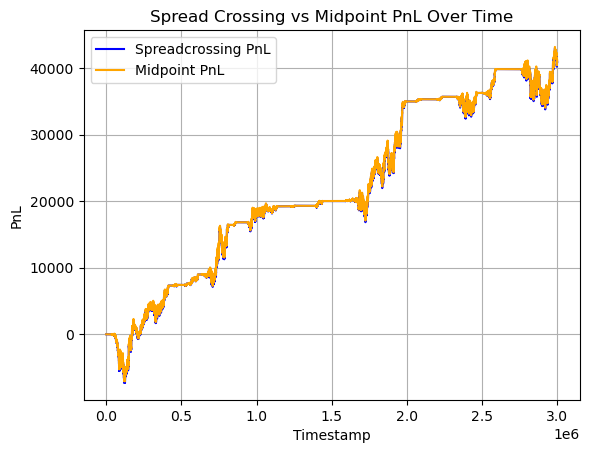

In [94]:
import matplotlib.pyplot as plt    
product = "PICNIC_BASKET1"

resin_metrics = bt.calculate_metrics(product)
print(f"PNL: {bt.pnl}")
print(f"Total PNL: {sum(bt.pnl.values())}")

print(f"Midpoint Sharpe: {resin_metrics['midpoint_sharpe']:.4f}")
print(f"Spreadcrossing Sharpe: {resin_metrics['spreadcrossing_sharpe']:.4f}")
print(f"Midpoint PnL (bps): {resin_metrics['midpoint_pnl_bps']:.2f}")
print(f"Spreadcrossing PnL (bps): {resin_metrics['spreadcrossing_pnl_bps']:.2f}")

# THIS PART PLOTS SPREADCROSSING_PNL AND MIDPOINT_PNL
spreadcrossing_pnl_history = bt.get_metric("spreadcrossing_pnl", product)
midpoint_pnl_history = bt.get_metric("midpoint_pnl", product)
timestamps = np.unique(bt.market_data["timestamp"])

plt.plot(timestamps, spreadcrossing_pnl_history, label="Spreadcrossing PnL", color="blue")
plt.plot(timestamps, midpoint_pnl_history, label="Midpoint PnL", color="orange")
plt.xlabel("Timestamp")
plt.ylabel("PnL")
plt.title("Spread Crossing vs Midpoint PnL Over Time")
plt.legend()
plt.grid(True)
plt.show()


You can copy paste everything, except for the Trader algo, which should be whatever algo you wish to backtest.

In [78]:
edge_0 = 70
edge_max = 150

edge_max_retreet = 100
edge_0_retreet = 0

position_max = int(250/4)

In [331]:
pos_sell = exit_size_function(95, edge_0_retreet, edge_max_retreet, position_max)
pos_sell

-61.845

In [332]:
size_function(133, edge_0, edge_max, position_max)

-38.449687499999996